# Bank Loan Defaulter Prediction
## DOMAIN: Finance and Banking

### PROJECT OBJECTIVE: 
The Goal is to predict if a customer will be a loan defaulter or not based on the given input features such as funded amount, term, interest rate etc.

### Dataset Information:
Dataset has around 67463 instances and 35 features and includes target column as Loan Status.(1=Defaulter and 0=Non Defaulters)

### Attribute Information:

- ID: unique ID of representative.
- Loan Amount: loan amount applied.
- Funded Amount: loan amount funded.
- Funded Amount Investor: loan amount approved by the investors.
- Term: term of loan (in months).
- Batch Enrolled: batch numbers to representatives.
- Interest Rate: interest rate (%) on loan.
- Grade: grade by the bank.
- Sub Grade: sub-grade by the bank.
- Employment Duration: duration.
- Home Ownership: Owner ship of home.
- Verification Status: Income verification by the bank.
- Payment Plan: if any payment plan has started against loan.
- Loan Title: loan title provided.
- Debit to Income: ratio of representative's total monthly debt repayment divided by self reported monthly income excluding       mortgage.
- Delinquency - two years: number of 30+ days delinquency in past 2 years.
- Inquires- six months: total number of inquiries in last 6 months.
- Open Account: number of open credit line in representative's credit line.
- Public Record: number of derogatory public records.
- Revolving Balance: total credit revolving balance.
- Revolving Utilities: amount of credit a representative is using relative to revolving_balance.
- Total Accounts: total number of credit lines available in representatives credit line.
- Initial List Status: unique listing status of the loan - W(Waiting), F(Forwarded).
- Total Received Interest: total interest received till date.
- Total Received Late Fee: total late fee received till date.
- Recoveries: post charge off gross recovery.
- Collection Recovery Fee: post charge off collection fee.
- Collection 12 months Medical: total collections in last 12 months excluding medical collections.
- Application Type: indicates when the representative is an individual or joint.
- Last week Pay: indicates how long (in weeks) a representative has paid EMI after batch enrolled.
- Accounts Delinquent: number of accounts on which the representative is delinquent.
- Total Collection Amount: total collection amount ever owed.
- Total Current Balance: total current balance from all accounts.
- Total Revolving Credit Limit: total revolving credit limit.
- Loan Status: 1 = Defaulter, 0 = Non Defaulters.

## Step1: Import libraries and Read the dataset 

In [2]:
# Importing required libraries
%matplotlib inline
import pandas as pd
import numpy as np
from sklearn import metrics
from scipy.stats import zscore
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import pyplot
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier 
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import StackingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn import preprocessing
from mlxtend.plotting import plot_sequential_feature_selection as plot_sfs
from sklearn.preprocessing import StandardScaler 

In [3]:
import warnings
warnings.filterwarnings('ignore')

In [4]:
# !pip install -U imbalanced-learn

In [5]:
import imblearn
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler

In [6]:
# Reading the dataset
df = pd.read_csv('bank_loan_defaulter.csv')

In [7]:
df.head()

,ID,Loan Amount,Funded Amount,Funded Amount Investor,Term,Batch Enrolled,Interest Rate,Grade,Sub Grade,Employment Duration,...,Recoveries,Collection Recovery Fee,Collection 12 months Medical,Application Type,Last week Pay,Accounts Delinquent,Total Collection Amount,Total Current Balance,Total Revolving Credit Limit,Loan Status
0,65087372,10000,32236,12329.36286,59,BAT2522922,11.135007,B,C4,MORTGAGE,...,2.498291,0.793724,0,INDIVIDUAL,49,0,31,311301,6619,0
1,1450153,3609,11940,12191.99692,59,BAT1586599,12.237563,C,D3,RENT,...,2.377215,0.974821,0,INDIVIDUAL,109,0,53,182610,20885,0
2,1969101,28276,9311,21603.22455,59,BAT2136391,12.545884,F,D4,MORTGAGE,...,4.316277,1.020075,0,INDIVIDUAL,66,0,34,89801,26155,0
3,6651430,11170,6954,17877.15585,59,BAT2428731,16.731201,C,C3,MORTGAGE,...,0.107020,0.749971,0,INDIVIDUAL,39,0,40,9189,60214,0
4,14354669,16890,13226,13539.92667,59,BAT5341619,15.008300,C,D4,MORTGAGE,...,1294.818751,0.368953,0,INDIVIDUAL,18,0,430,126029,22579,0


In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 67463 entries, 0 to 67462
Data columns (total 35 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   ID                            67463 non-null  int64  
 1   Loan Amount                   67463 non-null  int64  
 2   Funded Amount                 67463 non-null  int64  
 3   Funded Amount Investor        67463 non-null  float64
 4   Term                          67463 non-null  int64  
 5   Batch Enrolled                67463 non-null  object 
 6   Interest Rate                 67463 non-null  float64
 7   Grade                         67463 non-null  object 
 8   Sub Grade                     67463 non-null  object 
 9   Employment Duration           67463 non-null  object 
 10  Home Ownership                67463 non-null  float64
 11  Verification Status           67463 non-null  object 
 12  Payment Plan                  67463 non-null  object 
 13  L

- So there are total 35 columns, including the target column, with 67463 entries.
- Most of the columns are numeric with 9 of them being object data type.
- There are no null entries in any column

## Step2: Data cleansing and Exploratory data analysis

In [9]:
df.duplicated('ID').sum() 
# shows no duplicates

0

In [10]:
df.isnull().sum()
# shows no missing values

ID                              0
Loan Amount                     0
Funded Amount                   0
Funded Amount Investor          0
Term                            0
Batch Enrolled                  0
Interest Rate                   0
Grade                           0
Sub Grade                       0
Employment Duration             0
Home Ownership                  0
Verification Status             0
Payment Plan                    0
Loan Title                      0
Debit to Income                 0
Delinquency - two years         0
Inquires - six months           0
Open Account                    0
Public Record                   0
Revolving Balance               0
Revolving Utilities             0
Total Accounts                  0
Initial List Status             0
Total Received Interest         0
Total Received Late Fee         0
Recoveries                      0
Collection Recovery Fee         0
Collection 12 months Medical    0
Application Type                0
Last week Pay 

In [11]:
# Summary Stats of dataset
df.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
ID,67463.0,2.562761e+07,2.109155e+07,1.297933e+06,6.570288e+06,1.791565e+07,4.271521e+07,7.224578e+07
Loan Amount,67463.0,1.684890e+04,8.367866e+03,1.014000e+03,1.001200e+04,1.607300e+04,2.210600e+04,3.500000e+04
Funded Amount,67463.0,1.577060e+04,8.150993e+03,1.014000e+03,9.266500e+03,1.304200e+04,2.179300e+04,3.499900e+04
Funded Amount Investor,67463.0,1.462180e+04,6.785345e+03,1.114590e+03,9.831685e+03,1.279368e+04,1.780759e+04,3.499975e+04
Term,67463.0,5.817381e+01,3.327441e+00,3.600000e+01,5.800000e+01,5.900000e+01,5.900000e+01,5.900000e+01
Interest Rate,67463.0,1.184626e+01,3.718629e+00,5.320006e+00,9.297147e+00,1.137770e+01,1.419353e+01,2.718235e+01
Home Ownership,67463.0,8.054150e+04,4.502912e+04,1.457354e+04,5.168984e+04,6.933583e+04,9.462332e+04,4.065615e+05
Debit to Income,67463.0,2.329924e+01,8.451824e+00,6.752991e-01,1.675642e+01,2.265666e+01,3.004840e+01,3.962986e+01
Delinquency - two years,67463.0,3.271275e-01,8.008884e-01,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,8.000000e+00
Inquires - six months,67463.0,1.457540e-01,4.732913e-01,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,5.000000e+00


- Loan Amount varies between around 1k to 35k rupees with median being 16k
- Term of loan varies from 36 to 59 months (approx 3 to 5 years)
- Interest rates start form 5.3% with max being 27%
- For all the entries, number of 'Accounts Delinquent' is 0

In [12]:
df.describe(include='O').transpose()

,count,unique,top,freq
Batch Enrolled,67463,41,BAT3873588,3626
Grade,67463,7,C,19085
Sub Grade,67463,35,B4,4462
Employment Duration,67463,3,MORTGAGE,36351
Verification Status,67463,3,Source Verified,33036
Payment Plan,67463,1,n,67463
Loan Title,67463,109,Credit card refinancing,30728
Initial List Status,67463,2,w,36299
Application Type,67463,2,INDIVIDUAL,67340


- There are 7 categories of 'Grade' with 'C' having highest frequency
- 35 type of 'subgrades'
- Approx 50% entries show 'Mortgage' type of 'Employment Duration'
- Approx 50% entries have 'Source Verified	' type of 'Verification Status'
- For all entries payment plan has not yet started
- For approx 50% entries, 'Initial List Status' of loan is waiting
- For more than 90% entries, 'Application Type' is individual

In [14]:
# Removing any redundant columns:
# We'll remove 'ID', 'Payment Plan' and 'Accounts Delinquent' (From stats summary, we observed 'Payment Plan' and 'Accounts Delinquent' have same value for all the entries, so they are of no use)
df.drop(['ID', 'Payment Plan', 'Accounts Delinquent'], axis=1, inplace=True)
df.shape

(67463, 32)

### Univariate Analysis

In [18]:
df.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Loan Amount,67463.0,16848.902776,8367.865726,1014.000000,10012.000000,16073.000000,22106.000000,3.500000e+04
Funded Amount,67463.0,15770.599114,8150.992662,1014.000000,9266.500000,13042.000000,21793.000000,3.499900e+04
Funded Amount Investor,67463.0,14621.799323,6785.345170,1114.590204,9831.684984,12793.682170,17807.594120,3.499975e+04
Term,67463.0,58.173814,3.327441,36.000000,58.000000,59.000000,59.000000,5.900000e+01
Interest Rate,67463.0,11.846258,3.718629,5.320006,9.297147,11.377696,14.193533,2.718235e+01
Home Ownership,67463.0,80541.502522,45029.120366,14573.537170,51689.843335,69335.832680,94623.322785,4.065615e+05
Debit to Income,67463.0,23.299241,8.451824,0.675299,16.756416,22.656658,30.048400,3.962986e+01
Delinquency - two years,67463.0,0.327127,0.800888,0.000000,0.000000,0.000000,0.000000,8.000000e+00
Inquires - six months,67463.0,0.145754,0.473291,0.000000,0.000000,0.000000,0.000000,5.000000e+00
Open Account,67463.0,14.266561,6.225060,2.000000,10.000000,13.000000,16.000000,3.700000e+01


<AxesSubplot:xlabel='Loan Amount', ylabel='Density'>

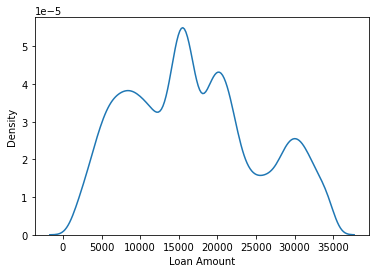

In [19]:
sns.kdeplot(data=df, x='Loan Amount')

<AxesSubplot:xlabel='Funded Amount', ylabel='Density'>

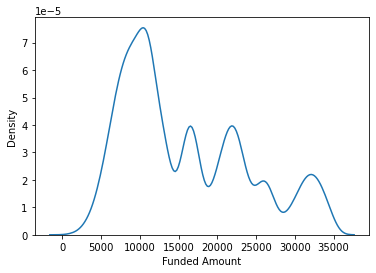

In [20]:
sns.kdeplot(data=df, x='Funded Amount')

In [23]:
df['Term'].value_counts()

59    43780
58    22226
36     1457
Name: Term, dtype: int64

<AxesSubplot:xlabel='Term', ylabel='Density'>

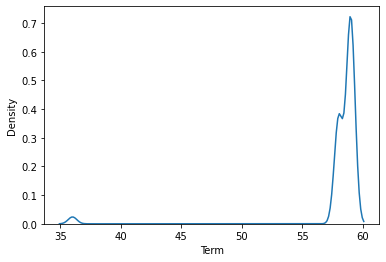

In [24]:
sns.kdeplot(df['Term'])

### Univariate Analysis of Categorical Variables

In [25]:
df.describe(include='O').transpose()

,count,unique,top,freq
Batch Enrolled,67463,41,BAT3873588,3626
Grade,67463,7,C,19085
Sub Grade,67463,35,B4,4462
Employment Duration,67463,3,MORTGAGE,36351
Verification Status,67463,3,Source Verified,33036
Loan Title,67463,109,Credit card refinancing,30728
Initial List Status,67463,2,w,36299
Application Type,67463,2,INDIVIDUAL,67340


<AxesSubplot:ylabel='Application Type'>

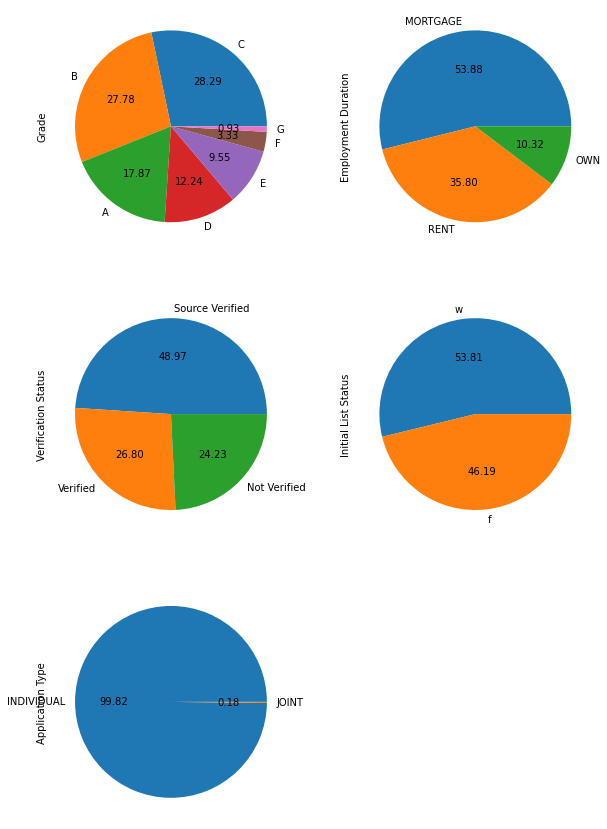

In [26]:
plt.figure(figsize=(10, 15))
plt.subplot(3,2,1)
df['Grade'].value_counts().plot(kind='pie', autopct='%.2f')
plt.subplot(3,2,2)
df['Employment Duration'].value_counts().plot(kind='pie', autopct='%.2f')
plt.subplot(3,2,3)
df['Verification Status'].value_counts().plot(kind='pie', autopct='%.2f')
plt.subplot(3,2,4)
df['Initial List Status'].value_counts().plot(kind='pie', autopct='%.2f')
plt.subplot(3,2,5)
df['Application Type'].value_counts().plot(kind='pie', autopct='%.2f')

### Multivariate Analysis

<AxesSubplot:>

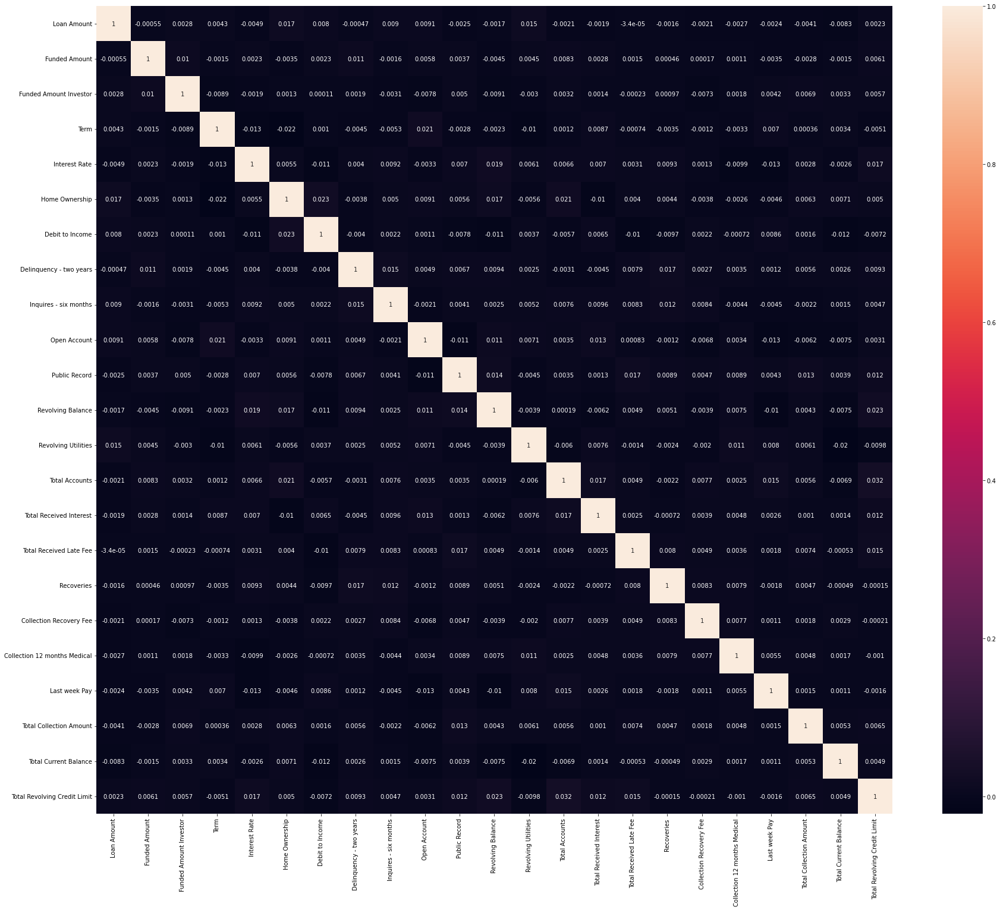

In [233]:
plt.figure(figsize=(30, 25))
sns.heatmap(df.corr(), annot=True)

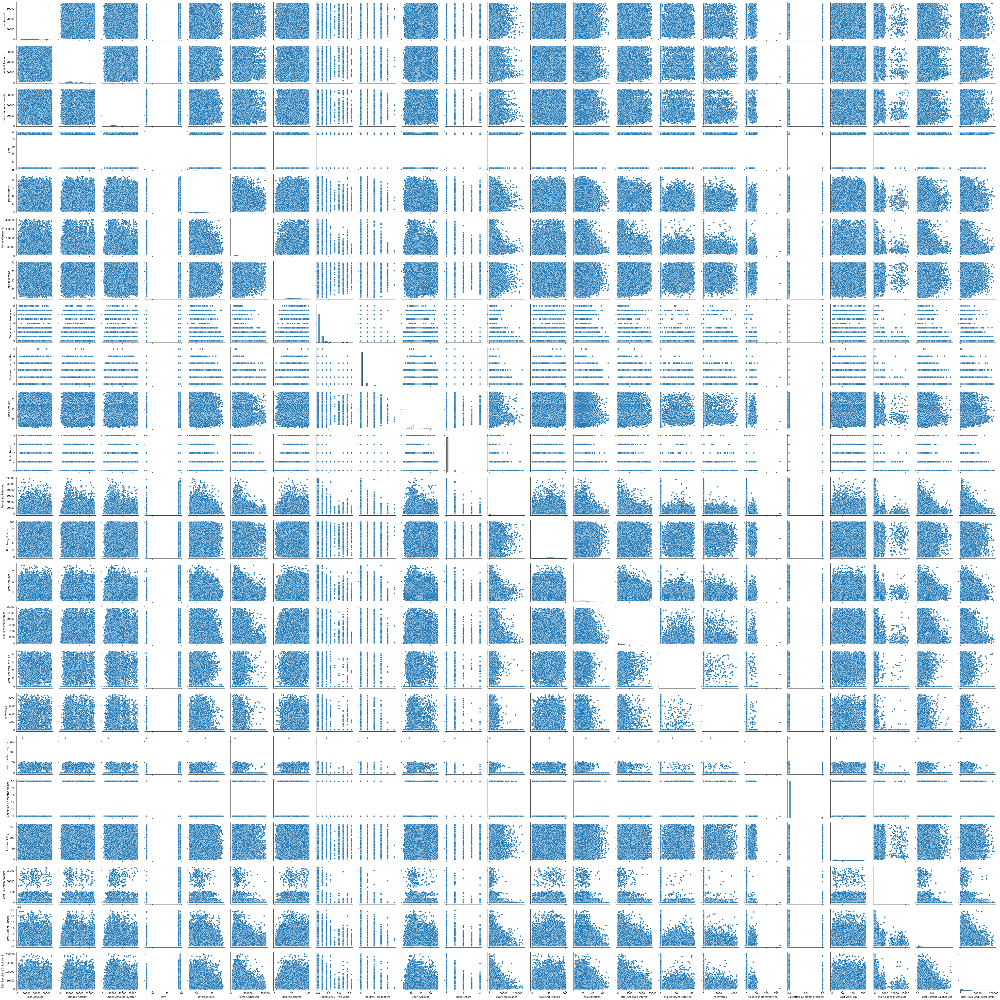

In [234]:
sns.pairplot(data=df)

### Inferences:
- From both heatmap and pairplot we can clearly see that there is no significant correlation between any of the numeric variables.

### Distribution of the target variable

<AxesSubplot:xlabel='Loan Status', ylabel='count'>

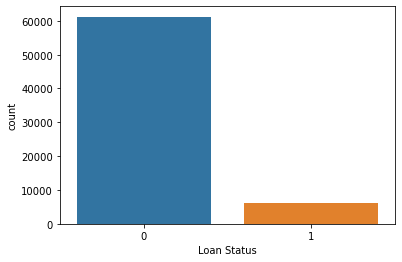

In [28]:
sns.countplot(df['Loan Status'])
# 0 ---> Non-defaulter
# 1 ---> Defaulter

- We can see the huge imbalance in the classes of 'Loan Status' column
- Most of the instances are of Non-defaulter

## Step3: Data preparation for model building

In [29]:
df.shape

(67463, 32)

In [30]:
# Segregating the target and independent features
X = df.drop('Loan Status', axis=1)
y = df.pop('Loan Status')

In [31]:
print(X.shape)
print(y.shape)

(67463, 31)
(67463,)


In [32]:
# Encoding categorical data
le = preprocessing.LabelEncoder()
X_encoded = X.copy()

In [33]:
# X_encoded.describe(include='O').transpose()

In [34]:
cat_cols = X.select_dtypes(include=['object']).columns
# cat_cols
for x in cat_cols:
    X_encoded[x] = le.fit_transform(X_encoded[x])
    

In [35]:
X_encoded

,Loan Amount,Funded Amount,Funded Amount Investor,Term,Batch Enrolled,Interest Rate,Grade,Sub Grade,Employment Duration,Home Ownership,...,Total Received Interest,Total Received Late Fee,Recoveries,Collection Recovery Fee,Collection 12 months Medical,Application Type,Last week Pay,Total Collection Amount,Total Current Balance,Total Revolving Credit Limit
0,10000,32236,12329.36286,59,16,11.135007,1,13,0,176346.62670,...,2929.646315,0.102055,2.498291,0.793724,0,0,49,31,311301,6619
1,3609,11940,12191.99692,59,4,12.237563,2,17,2,39833.92100,...,772.769385,0.036181,2.377215,0.974821,0,0,109,53,182610,20885
2,28276,9311,21603.22455,59,11,12.545884,5,18,0,91506.69105,...,863.324396,18.778660,4.316277,1.020075,0,0,66,34,89801,26155
3,11170,6954,17877.15585,59,15,16.731201,2,12,0,108286.57590,...,288.173196,0.044131,0.107020,0.749971,0,0,39,40,9189,60214
4,16890,13226,13539.92667,59,32,15.008300,2,18,0,44234.82545,...,129.239553,19.306646,1294.818751,0.368953,0,0,18,430,126029,22579
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
67458,13601,6848,13175.28583,59,21,9.408858,2,3,0,83961.15003,...,1978.945960,0.023478,564.614852,0.865230,0,0,69,48,181775,34301
67459,8323,11046,15637.46301,59,7,9.972104,2,7,2,65491.12817,...,3100.803125,0.027095,2.015494,1.403368,0,0,14,37,22692,8714
67460,15897,32921,12329.45775,59,5,19.650943,0,27,0,34813.96985,...,2691.995532,0.028212,5.673092,1.607093,0,0,137,17,176857,42330
67461,16567,4975,21353.68465,59,14,13.169095,3,22,1,96938.83564,...,3659.334202,0.074508,1.157454,0.207608,0,0,73,61,361339,39075


In [36]:
X_encoded.info() # all features have been converted to numeric type now

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 67463 entries, 0 to 67462
Data columns (total 31 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Loan Amount                   67463 non-null  int64  
 1   Funded Amount                 67463 non-null  int64  
 2   Funded Amount Investor        67463 non-null  float64
 3   Term                          67463 non-null  int64  
 4   Batch Enrolled                67463 non-null  int32  
 5   Interest Rate                 67463 non-null  float64
 6   Grade                         67463 non-null  int32  
 7   Sub Grade                     67463 non-null  int32  
 8   Employment Duration           67463 non-null  int32  
 9   Home Ownership                67463 non-null  float64
 10  Verification Status           67463 non-null  int32  
 11  Loan Title                    67463 non-null  int32  
 12  Debit to Income               67463 non-null  float64
 13  D

### Handle the imbalanced data using oversampling approach SMOTE

In [37]:
# Target variable classes
y.value_counts() # 0 for non-defaulter
                 # 1 for defaulter

0    61222
1     6241
Name: Loan Status, dtype: int64

In [38]:
# oversampling using SMOTE

print("Before UpSampling, counts of label '1': {}".format(sum(y==1)))
print("Before UpSampling, counts of label '0': {} \n".format(sum(y==0)))

sm = SMOTE(sampling_strategy = 1 ,k_neighbors = 5, random_state=1)   
X_up, y_up = sm.fit_resample(X_encoded, y.ravel())


print("After UpSampling, counts of label '1': {}".format(sum(y_up==1)))
print("After UpSampling, counts of label '0': {} \n".format(sum(y_up==0)))



print('After UpSampling, the shape of X_up: {}'.format(X_up.shape))
print('After UpSampling, the shape of y_up: {} \n'.format(y_up.shape))


Before UpSampling, counts of label '1': 6241
Before UpSampling, counts of label '0': 61222 

After UpSampling, counts of label '1': 61222
After UpSampling, counts of label '0': 61222 

After UpSampling, the shape of X_up: (122444, 31)
After UpSampling, the shape of y_up: (122444,) 



In [39]:
# Since the upsampled data is very large, so we'll take only a portion of this dataset to reduce computation
# We'll use train test split function so as to preserve the ratio of classes in predictor variable

X_, X_sample, y_, y_sample = train_test_split(X_up, y_up, test_size=0.37, random_state=5, stratify=y_up) 
print(X_sample.shape)
print(y_sample.shape)

(45305, 31)
(45305,)


### Split the data into train and test set

In [41]:
# We'll be using upsampled data for further computations
X_train, X_test, y_train, y_test = train_test_split(X_sample, y_sample, test_size=0.2, random_state=7, stratify=y_sample) 

In [42]:
pd.value_counts(y_train)

0    18122
1    18122
dtype: int64

In [43]:
pd.value_counts(y_test) # We can see, ratio is maintained between classes

1    4531
0    4530
dtype: int64

### Data Standardization

In [45]:
X_train_z = X_train.apply(zscore)
X_test_z = X_test.apply(zscore)

### Selecting the K best features using wrapper methods

In [200]:
X_train_z.shape # We have 31 features in the original set

(36244, 31)

In [49]:
# !pip install mlxtend
from mlxtend.feature_selection import SequentialFeatureSelector as sfs

#### Using Backward Feature Elimination

In [60]:
# Build LogReg  to use in feature selection
logR2 = LogisticRegression(solver='lbfgs', max_iter=1000)
# Build backward feature selection
logreg_backward = sfs(logR2, k_features=10, forward=False, cv=10)
# Perform SFFS
sfs_backward = logreg_backward.fit(X_train_z.values, y_train)

In [61]:
sfs_backward1=sfs_backward.get_metric_dict()

In [62]:
#Converting result of sf1 to dataframe
sfs_backward1 = pd.DataFrame.from_dict(sfs_backward1)

In [63]:
sfs_backward1

,31,30,29,28,27,26,25,24,23,22,...,19,18,17,16,15,14,13,12,11,10
feature_idx,"(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...","(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...","(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...","(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...","(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...","(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...","(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...","(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...","(0, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14...","(0, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 13, 14, 15...",...,"(0, 1, 2, 4, 6, 7, 8, 9, 10, 11, 13, 14, 15, 1...","(0, 1, 2, 4, 6, 7, 8, 10, 11, 13, 14, 15, 16, ...","(0, 1, 4, 6, 7, 8, 10, 11, 13, 14, 15, 16, 19,...","(0, 1, 4, 6, 7, 8, 10, 11, 13, 14, 15, 16, 19,...","(0, 1, 4, 6, 7, 8, 10, 11, 13, 14, 15, 16, 19,...","(0, 1, 4, 6, 8, 10, 11, 13, 14, 15, 16, 19, 20...","(0, 1, 4, 6, 8, 10, 11, 13, 14, 16, 19, 20, 25)","(0, 1, 4, 6, 8, 10, 13, 14, 16, 19, 20, 25)","(1, 4, 6, 8, 10, 13, 14, 16, 19, 20, 25)","(1, 4, 6, 8, 10, 13, 14, 16, 20, 25)"
cv_scores,"[0.6797241379310345, 0.6725517241379311, 0.682...","[0.6805517241379311, 0.6725517241379311, 0.682...","[0.6805517241379311, 0.6728275862068965, 0.683...","[0.6811034482758621, 0.6722758620689655, 0.681...","[0.6802758620689655, 0.6728275862068965, 0.681...","[0.6802758620689655, 0.6728275862068965, 0.680...","[0.6816551724137931, 0.6717241379310345, 0.681...","[0.6786206896551724, 0.672, 0.6766896551724138...","[0.6791724137931034, 0.6711724137931034, 0.679...","[0.679448275862069, 0.672, 0.679448275862069, ...",...,"[0.6777931034482758, 0.672, 0.6835862068965517...","[0.6788965517241379, 0.6731034482758621, 0.683...","[0.6797241379310345, 0.670896551724138, 0.6822...","[0.6791724137931034, 0.6700689655172414, 0.684...","[0.68, 0.6697931034482759, 0.6833103448275862,...","[0.6816551724137931, 0.6731034482758621, 0.676...","[0.6819310344827586, 0.6736551724137931, 0.678...","[0.6822068965517242, 0.6731034482758621, 0.678...","[0.6813793103448276, 0.670344827586207, 0.6761...","[0.6791724137931034, 0.6736551724137931, 0.677..."
avg_score,0.677161,0.677354,0.677436,0.677657,0.677602,0.677492,0.677243,0.677216,0.677271,0.677437,...,0.677216,0.676829,0.676857,0.676692,0.676443,0.675919,0.676222,0.676747,0.676223,0.675395
feature_names,"(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...","(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...","(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...","(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...","(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...","(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...","(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...","(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...","(0, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14...","(0, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 13, 14, 15...",...,"(0, 1, 2, 4, 6, 7, 8, 9, 10, 11, 13, 14, 15, 1...","(0, 1, 2, 4, 6, 7, 8, 10, 11, 13, 14, 15, 16, ...","(0, 1, 4, 6, 7, 8, 10, 11, 13, 14, 15, 16, 19,...","(0, 1, 4, 6, 7, 8, 10, 11, 13, 14, 15, 16, 19,...","(0, 1, 4, 6, 7, 8, 10, 11, 13, 14, 15, 16, 19,...","(0, 1, 4, 6, 8, 10, 11, 13, 14, 15, 16, 19, 20...","(0, 1, 4, 6, 8, 10, 11, 13, 14, 16, 19, 20, 25)","(0, 1, 4, 6, 8, 10, 13, 14, 16, 19, 20, 25)","(1, 4, 6, 8, 10, 13, 14, 16, 19, 20, 25)","(1, 4, 6, 8, 10, 13, 14, 16, 20, 25)"
ci_bound,0.005168,0.005167,0.005186,0.005048,0.005055,0.004972,0.00531,0.005476,0.006018,0.005934,...,0.006203,0.006155,0.005843,0.005806,0.005916,0.005292,0.00591,0.006122,0.006031,0.00565
std_dev,0.006959,0.006957,0.006983,0.006797,0.006806,0.006694,0.00715,0.007373,0.008102,0.007989,...,0.008352,0.008287,0.007867,0.007817,0.007966,0.007125,0.007958,0.008242,0.00812,0.007607
std_err,0.00232,0.002319,0.002328,0.002266,0.002269,0.002231,0.002383,0.002458,0.002701,0.002663,...,0.002784,0.002762,0.002622,0.002606,0.002655,0.002375,0.002653,0.002747,0.002707,0.002536


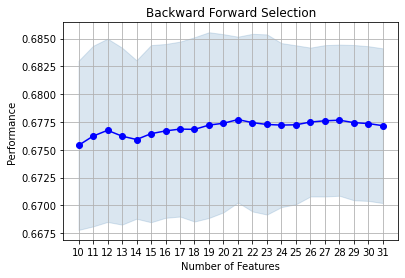

In [64]:
fig = plot_sfs(sfs_backward1)

plt.title('Backward Forward Selection')
plt.grid()
plt.show()

From above plot we can see that we can work with just 21 features so lets get a list of only 21 !

In [65]:
logreg_backward = sfs(logR2, k_features=21, forward=False, cv=10)
# Perform SFFS
sfs_backward = logreg_backward.fit(X_train_z.values, y_train)

In [66]:
feat_cols_back = list(sfs_backward.k_feature_idx_)
print(feat_cols_back)

[0, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 13, 14, 15, 16, 17, 19, 20, 22, 25, 28]


In [67]:
subsetColumnList_back = [columnList[i] for i in feat_cols_back] 
print(subsetColumnList_back)

['Loan Amount', 'Funded Amount', 'Funded Amount Investor', 'Batch Enrolled', 'Interest Rate', 'Grade', 'Sub Grade', 'Employment Duration', 'Home Ownership', 'Verification Status', 'Loan Title', 'Delinquency - two years', 'Inquires - six months', 'Open Account', 'Public Record', 'Revolving Balance', 'Total Accounts', 'Initial List Status', 'Total Received Late Fee', 'Collection 12 months Medical', 'Total Collection Amount']


## Step4: Model Building and evaluation

In [102]:
# Function to fit and print model predictions
def predict_model (model, X_train, y_train, X_test, y_test):
    model.fit(X_train, y_train)
    print('Train accuracy = ', model.score(X_train, y_train))  # performance on train data
    print('Test accuracy = ', model.score(X_test, y_test))  # performance on test data
    y_pred = model.predict(X_test)
    print('Confusion Matrix: \n', metrics.confusion_matrix(y_pred, y_test))

### 4.1 Building a base model using the Original Imbalanced data.

In [83]:
# Original imbalanced data is X_encoded and y
# Lets split the imbalanced data into train and test set
X_train_imb, X_test_imb, y_train_imb, y_test_imb = train_test_split(X_encoded, y, test_size=0.2, random_state=77, stratify=y) 

In [113]:
# sns.countplot(y_train_imb)
# sns.countplot(y_test_imb)

#### Random forest base model with backward selection features

In [222]:
rf_imb = RandomForestClassifier(criterion = 'entropy', random_state = 23, max_depth=15, max_leaf_nodes=12)

In [223]:
predict_model(rf_imb, X_train_imb[subsetColumnList_back], y_train_imb, X_test_imb[subsetColumnList_back], y_test_imb)

Train accuracy =  0.9074856401704651
Test accuracy =  0.9075075965315349
Confusion Matrix: 
 [[12245  1248]
 [    0     0]]


We can clearly see from the confusion matrix that the model has predicted all the instances as one class only,
and since the data is highly imbalanced, that's why the train and test accuracies are so good even though the minority class is 
wrongly predicted !

### 4.2 Building tuned models with balanced data through apt methods

#### 1) Random Forest Classifier

In [165]:
rf = RandomForestClassifier(n_estimators=50, criterion = 'entropy')

In [166]:
# Lets do grid search for optimum hyperparameters of the model
from sklearn.model_selection import GridSearchCV
import time

In [199]:
param_grid = {"max_depth": [3, 5],
              "min_samples_split": [2, 3, 10],
              "min_samples_leaf": [1, 3, 10]}

# run grid search
start_time = time.time()

grid_search_rf = GridSearchCV(rf, param_grid=param_grid)
grid_search_rf.fit(X_train_z[subsetColumnList_back], y_train)

end_time = time.time()
elapsed_time = end_time - start_time
print("Elapsed time: ", elapsed_time, " seconds")

Elapsed time:  222.60275530815125  seconds


In [201]:
grid_search_rf.best_params_

{'max_depth': 5, 'min_samples_leaf': 1, 'min_samples_split': 3}

In [202]:
grid_search_rf.cv_results_['mean_test_score']

array([0.72759628, 0.72740308, 0.72011901, 0.72754117, 0.72000884,
       0.72594026, 0.72119497, 0.71934668, 0.72249217, 0.74370912,
       0.74622   , 0.74575092, 0.7411709 , 0.74246777, 0.7418055 ,
       0.742109  , 0.74409533, 0.74296417])

In [203]:
grid_search_rf.best_estimator_

RandomForestClassifier(criterion='entropy', max_depth=5, min_samples_split=3,
                       n_estimators=50)

In [204]:
print("Train data accuracy score: ", grid_search_rf.score(X_train_z[subsetColumnList_back],y_train))
print("Test data accuracy score: ", grid_search_rf.score(X_test_z[subsetColumnList_back],y_test))
prediction = grid_search_rf.predict(X_test_z[subsetColumnList_back])
print("Confusion Matrix:\n",metrics.confusion_matrix(prediction,y_test))

Train data accuracy score:  0.7416399955854762
Test data accuracy score:  0.7322591325460766
Confusion Matrix:
 [[3513 1409]
 [1017 3122]]


#### 2) Gradient Boosting Classifier

In [147]:
gbcl = GradientBoostingClassifier()

In [150]:
param_gbcl = {
    'n_estimators' : (50, 100), 
    'learning_rate' : (0.01, 0.09)
    }
# Create an instance of GridSearchCV as model
gs_gbcl = GridSearchCV(gbcl, param_gbcl,cv=5,n_jobs=-1,verbose=1)

start_time = time.time()
#learning
gs_gbcl.fit(X_train_z[subsetColumnList_back], y_train) # .... using backward selection features

end_time = time.time()
elapsed_time = end_time - start_time
print("Elapsed time: ", elapsed_time, " seconds")

Fitting 5 folds for each of 4 candidates, totalling 20 fits
Elapsed time:  139.85078358650208  seconds


In [151]:
# print best hyperparameters from shared set of parameters
print("Best Hyper Parameters:\n",gs_gbcl.best_params_)

#evaluation(Accuracy)
print("Train data accuracy score: ", gs_gbcl.score(X_train_z[subsetColumnList_back], y_train))
print("Test data accuracy score: ", gs_gbcl.score(X_test_z[subsetColumnList_back], y_test))

#evaluation(Confusion Matrix)
prediction = gs_gbcl.predict(X_test_z[subsetColumnList_back])
print("Confusion Matrix:\n",metrics.confusion_matrix(prediction,y_test))


Best Hyper Parameters:
 {'learning_rate': 0.09, 'n_estimators': 100}
Train data accuracy score:  0.81025824964132
Test data accuracy score:  0.7766250965677077
Confusion Matrix:
 [[3849 1343]
 [ 681 3188]]


#### 3) Stacking Classifier

In [218]:
# We'll use tuned random forest and gradient boost models as estimators for stacking classifier

rf_ = RandomForestClassifier(criterion='entropy', max_depth=5, min_samples_split=3, n_estimators=50)
gbcl_ = GradientBoostingClassifier(n_estimators = 100, learning_rate = 0.09, random_state=6)

In [219]:
sc = StackingClassifier(estimators=[('rf_', rf_), ('gbcl_', gbcl_)], final_estimator= LogisticRegression())
sc

StackingClassifier(estimators=[('rf_',
                                RandomForestClassifier(criterion='entropy',
                                                       max_depth=5,
                                                       min_samples_split=3,
                                                       n_estimators=50)),
                               ('gbcl_',
                                GradientBoostingClassifier(learning_rate=0.09,
                                                           random_state=6))],
                   final_estimator=LogisticRegression())

In [221]:
predict_model(sc, X_train_z[subsetColumnList_back], y_train, X_test_z[subsetColumnList_back], y_test)

Train accuracy =  0.8132656439686569
Test accuracy =  0.7733142037302726
Confusion Matrix: 
 [[3815 1339]
 [ 715 3192]]


We observe that both Gradient Boosting Classifier and Stacking Classifier are performing the best.

## Step 5: Pipeline

In [228]:
# Lets build a pipeline for gradient boosting model

# Steps included in the pipeline:
# - Data Scaling
# - Feature Selection
# - Model Building

from sklearn.pipeline import Pipeline
pipe = Pipeline([('scl', StandardScaler()), ('feat_selection', sfs(LogisticRegression(), k_features=21, forward=False)), 
                 ("gbcl_", GradientBoostingClassifier(n_estimators = 100, learning_rate = 0.09, random_state=6))])

In [230]:
pipe.fit(X_train, y_train)

Pipeline(steps=[('scl', StandardScaler()),
                ('feat_selection',
                 SequentialFeatureSelector(estimator=LogisticRegression(),
                                           forward=False, k_features=(21, 21),
                                           scoring='accuracy')),
                ('gbcl_',
                 GradientBoostingClassifier(learning_rate=0.09,
                                            random_state=6))])

In [231]:
# Pipeline Performance

print(" Test score: {:.2f}". format( pipe.score( X_test, y_test)))
y_pred = pipe.predict(X_test)

from sklearn import metrics
print(metrics.classification_report(y_test, y_pred))

 Test score: 0.80
              precision    recall  f1-score   support

           0       0.78      0.84      0.81      4530
           1       0.83      0.77      0.80      4531

    accuracy                           0.80      9061
   macro avg       0.81      0.80      0.80      9061
weighted avg       0.81      0.80      0.80      9061



## Step 6: Conclusions

### Comparing evaluation metrics of base model and tuned model

Base Model ( Random Forest ):
- Base model used imbalanced data without any hyperparameter tuning
- It reported high bias towards the high frequency class and therefore the accuracy scores were good even though the false positives were zero.

Tuned Models ( Using Grid Search for tuning )
1) Random Forest ( criterion='entropy', max_depth=5, min_samples_split=3, n_estimators=50 )
- Train Acc = 74
- Test Acc = 73

2) Gradient Boosting Classifier (n_estimators = 100, learning_rate = 0.09, random_state=6)
- Train Acc = 81
- Test Acc = 77.6 
  
3) Stacking Classifier(with estimators RandomForest and Gradient Boosting Classifier, final_estimator= LogisticRegression())
- Train Acc = 81
- Test Acc = 77.3 

So Gradient Boosting Classifier and Stacking Classifier are the best performers.

Since the accuracies of both of them is same so we'll choose 'Gradient Boosting Classifier' as our final best performing model since Stacking Classifier is a complex and computational model as compared to Gradient Boosting Classifier.

Best Performing Model = 'Gradient Boosting Classifier'

### Steps taken to improve the performance of the model :
- Balancing of data using upsampling method
(Taking only a sample of upsampled data to reduce computational complexity)
- Feature Selection reduced the computation of the model by giving us the same accuracy with less number of features
- Getting the optimum set of hyperparameters using Grid Search method
- Training multiple models to get the best performing model

## Conclusion:
Best Performing Model = 'Gradient Boosting Classifier' with 77.6% test accuracy having:
- Optimum Hyperparameters = (n_estimators = 100, learning_rate = 0.09, random_state=6)
- Backward feature selection (only 21 features instead of original 35)
- Upsampled data